In [1]:
from skimage import data

/Users/costefan/.pyenv/versions/anaconda3-4.3.0/envs/ucu/lib/python3.7/site-packages/matplotlib/__init__.py:1038: UserWarning: Bad val "TkAggX" on line #1
	"backend: TkAggX
"
	in file "/Users/costefan/.matplotlib/matplotlibrc"
	Key backend: Unrecognized backend string 'tkaggx': valid strings are ['GTK3Agg', 'GTK3Cairo', 'MacOSX', 'nbAgg', 'Qt4Agg', 'Qt4Cairo', 'Qt5Agg', 'Qt5Cairo', 'TkAgg', 'TkCairo', 'WebAgg', 'WX', 'WXAgg', 'WXCairo', 'agg', 'cairo', 'pdf', 'pgf', 'ps', 'svg', 'template']
  (val, error_details, msg))


In [2]:
from skimage.color import rgb2gray
from numpy import r_

In [34]:
from io import BytesIO

In [3]:
from matplotlib import pyplot as plt

In [4]:
%matplotlib inline

In [5]:
DEFAULT_IMG_SIZE = (256, 256)

In [80]:
from skimage.transform import resize
import io
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack
import IPython
import pandas as pd


### Compression performance measures functions

In [95]:
def calculate_mse(imageA, imageB):
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])

    return err

def calculate_psnr(imageA, imageB):
    mse = np.mean( (imageA - imageB) ** 2 )
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    
    return 20 * np.log10(PIXEL_MAX / np.sqrt(mse))


def print_measures(imageA, imageB):
    
    print(pd.DataFrame([[calculate_mse(imageA, imageB),
                       calculate_psnr(imageA, imageB)]],
                       columns=["MSE", "PSNR"]))

### Load images

In [96]:
def get_image_and_resize(img_arr, size=DEFAULT_IMG_SIZE):
    image = Image.fromarray(img_arr)
    img_color = image.resize(size, 1)
    img_grey = img_color.convert('L')
    img = np.array(img_grey, dtype=np.float)

    return img

In [97]:
from skimage import img_as_ubyte, img_as_float

gray_images = {
    "cat": get_image_and_resize(data.chelsea()),
    "camera": get_image_and_resize(data.camera()),
    "coin": get_image_and_resize(data.coins()),
}

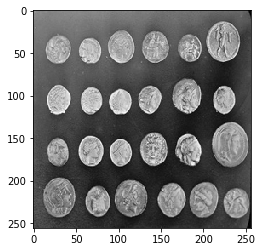

In [98]:
plt.imshow(gray_images['coin'], cmap=plt.cm.gray)

In [99]:
from numpy.linalg import svd
import numpy as np

## SVD

In [100]:
def compress_svd(img, k):
    """
    K - singular values
    """
    U, s, V = svd(img, full_matrices=False)
    reconst_matrix = np.dot(U[:, :k], np.dot(np.diag(s[:k]), (V[:k, :])))
    
    return reconst_matrix, s

In [101]:
print(gray_images['cat'].shape)

(256, 256)


In [120]:
def compress_svd_show_gray_images(img_name, k):
    """
    """
    image = gray_images[img_name]
    original_shape = image.shape
    
    reconst_img, s = compress_svd(image, k)
    fig, axes = plt.subplots(1, 2, figsize=(8, 5))
    axes[0].plot(s)
    
    compression_ratio = 100.0 * (k * (original_shape[0] + original_shape[1]) + k) / \
        (original_shape[0] * original_shape[1])
    
    axes[1].set_title("compression ratio {:.2f} %".format(compression_ratio))
    axes[1].imshow(reconst_img, cmap='gray')
    axes[1].axis('off')
    
    fig.tight_layout()
    
    print_measures(image, reconst_img)

In [121]:
from ipywidgets import interact, interactive

In [122]:
interact(compress_svd_show_gray_images, img_name=list(gray_images.keys()), k=(1, DEFAULT_IMG_SIZE[0]))

interactive(children=(Dropdown(description='img_name', options=('cat', 'camera', 'coin'), value='cat'), IntSli…

<function __main__.compress_svd_show_gray_images(img_name, k)>

### DCT

In [123]:
def get_2d_dct(img):
    """ Get 2D Cosine Transform of Image
    """
    return fftpack.dct(fftpack.dct(img, norm='ortho', axis=0), norm='ortho', axis=1)

def get_2d_idct(coefficients):
    """ Get 2D Inverse Cosine Transform of Image
    """
    return fftpack.idct(fftpack.idct(coefficients, axis=0 , norm='ortho'), axis=1 , norm='ortho')

In [124]:
def compress_dct(img):
    
    imsize = DEFAULT_IMG_SIZE
    dct = np.zeros(imsize)

    # Do 8x8 DCT on image (in-place)
    for i in r_[:imsize[0]:8]:
        for j in r_[:imsize[1]:8]:
            dct[i:(i+8),j:(j+8)] = get_2d_dct(img[i:(i+8),j:(j+8)] )
            
    return dct

def filter_by_number(dct, k):
    imsize = DEFAULT_IMG_SIZE
    dct_thresh = np.zeros(imsize)
    
    # Do 8x8 DCT on image (in-place)
    for i in r_[:imsize[0]:8]:
        for j in r_[:imsize[1]:8]:
            dummy_matrix = dct[i:(i+8),j:(j+8)]
            
            dummy_matrix[k:,:] = 0
            dummy_matrix[:,k:] = 0
            
            dct_thresh[i:(i+8),j:(j+8)] = dummy_matrix
    
    return dct_thresh

def filter_by_threshold(dct):
    imsize = DEFAULT_IMG_SIZE
    # Threshold
    thresh = 0.0012
    dct_thresh = dct * (abs(dct) > (thresh * np.max(dct)))


    plt.figure()
    plt.imshow(dct_thresh,cmap='gray',vmax = np.max(dct)*0.01,vmin = 0)
    plt.title( "Thresholded 8x8 DCTs of the image")

    percent_nonzeros = np.sum( dct_thresh != 0.0 ) / (imsize[0] * imsize[1]*1.0)

    print("Keeping only %f%% of the DCT coefficients" % (percent_nonzeros*100.0))
    
    return dct_thresh

def compress_dct_show_gray_images(img_name, k):
    image = gray_images[img_name]
    dct_size = image.shape[0]
    dct = get_2d_dct(image)
    
    dct_copy = dct.copy()
    dct_copy[k:,:] = 0
    dct_copy[:,k:] = 0
    
    # Reconstructed image
    reconst_img = get_2d_idct(dct_copy)
    
    plt.figure()
    plt.imshow(reconst_img ,cmap='gray')
    plt.title("Reconstructed image" )
    
    print_measures(image, reconst_img)

Text(0.5, 1.0, '8x8 DCTs of the image')

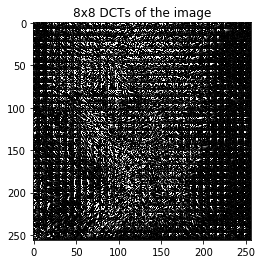

In [125]:
dct = compress_dct(gray_images['cat'])
plt.figure()
plt.imshow(dct, cmap='gray', vmax = np.max(dct) * 0.01, vmin = 0)
plt.title( "8x8 DCTs of the image")

In [126]:
interact(compress_dct_show_gray_images, img_name=list(gray_images.keys()), k=(1, 256))

interactive(children=(Dropdown(description='img_name', options=('cat', 'camera', 'coin'), value='cat'), IntSli…

<function __main__.compress_dct_show_gray_images(img_name, k)>

            MSE        PSNR
0  1.851886e-28  325.454662


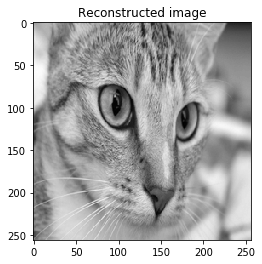

In [127]:
compress_dct_show_gray_images('cat', 256)

## Wavelet

In [128]:
import pywt

In [129]:
def compress_dwt(image, wavelet='haar'):
    coeffs2 = pywt.dwt2(image, 'haar')
    LL, (LH, HL, HH) = coeffs2
    titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
    
#     fig = plt.figure()
#     for i, a in enumerate([LL, LH, HL, HH]):
#         ax = fig.add_subplot(2, 2, i + 1)
#         ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
#         ax.set_title(titles[i], fontsize=12)
#         ax.set_xticks([])
#         ax.set_yticks([])
    
    # Now reconstruct and plot the original image
    reconstructed = pywt.idwt2(coeffs2, wavelet=wavelet)
    
    
    return coeffs2

def compress_dwt_show_gray_images(img_name, k, wavelet='haar'):
    img = gray_images[img_name]
    
    for iteration in range(k):
        img, _ = compress_dwt(img, wavelet)
        
    fig = plt.figure()
    plt.imshow(img, interpolation="nearest", cmap=plt.cm.gray)

In [130]:
interact(compress_dwt_show_gray_images, img_name=list(gray_images.keys()), k=(0, 10), wavelet=pywt.wavelist())

interactive(children=(Dropdown(description='img_name', options=('cat', 'camera', 'coin'), value='cat'), IntSli…

<function __main__.compress_dwt_show_gray_images(img_name, k, wavelet='haar')>

In [131]:
def tell_img_size(array):
    image = Image.fromarray(array)
    image = image.convert("L")
    img_file = BytesIO()
    image.save(img_file, 'png')
    print(img_file.tell())

## Compare SVD and DCT

           MSE       PSNR
0  1415.939576  16.620356
           MSE       PSNR
0  2746.905281  13.742367
          MSE       PSNR
0  996.526002  18.145917
           MSE      PSNR
0  2567.623437  14.03549
          MSE       PSNR
0  846.644704  18.853792
           MSE       PSNR
0  2537.230213  14.087205
          MSE       PSNR
0  723.144509  19.538553
           MSE       PSNR
0  2506.892631  14.139446
          MSE      PSNR
0  645.934251  20.02892
           MSE      PSNR
0  2490.952033  14.16715
          MSE       PSNR
0  577.172892  20.517744
           MSE       PSNR
0  2471.886878  14.200518
          MSE       PSNR
0  515.584429  21.007806
           MSE      PSNR
0  2441.880299  14.25356
          MSE       PSNR
0  459.468437  21.508247
           MSE       PSNR
0  2396.581518  14.334882
          MSE       PSNR
0  424.974289  21.847177
           MSE       PSNR
0  1901.660544  15.339474
          MSE       PSNR
0  398.309073  22.128602
           MSE      PSNR
0  1554.52014

/Users/costefan/.pyenv/versions/anaconda3-4.3.0/envs/ucu/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


          MSE      PSNR
0  372.320863  22.42163
           MSE       PSNR
0  1397.055008  16.678669
          MSE       PSNR
0  348.108204  22.713661
           MSE       PSNR
0  1308.433373  16.963287
          MSE       PSNR
0  324.294994  23.021401
           MSE       PSNR
0  1164.016505  17.471212
          MSE       PSNR
0  304.773548  23.291031
           MSE       PSNR
0  1029.622601  18.004023
          MSE       PSNR
0  288.061792  23.535947
         MSE       PSNR
0  912.01248  18.530796
          MSE       PSNR
0  272.061076  23.784139
          MSE       PSNR
0  854.089717  18.815769
         MSE       PSNR
0  256.95142  24.032293
          MSE       PSNR
0  815.641166  19.015812
          MSE      PSNR
0  243.614628  24.26377
          MSE       PSNR
0  787.938198  19.165882
         MSE       PSNR
0  231.33944  24.488307
          MSE       PSNR
0  766.319094  19.286707
          MSE       PSNR
0  220.049089  24.705608
          MSE       PSNR
0  752.164838  19.367673
  

         MSE      PSNR
0  12.827835  37.04927
          MSE      PSNR
0  155.652243  26.20925
         MSE       PSNR
0  12.387031  37.201131
          MSE       PSNR
0  153.522809  26.269075
         MSE       PSNR
0  11.955802  37.355016
          MSE       PSNR
0  150.523195  26.354769
         MSE       PSNR
0  11.546994  37.506114
          MSE       PSNR
0  147.880172  26.431704
         MSE       PSNR
0  11.152883  37.656932
          MSE       PSNR
0  145.305764  26.507975


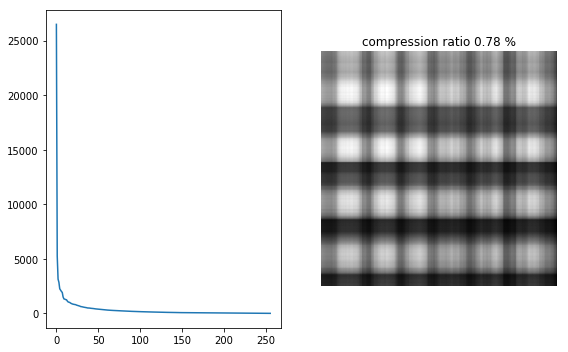

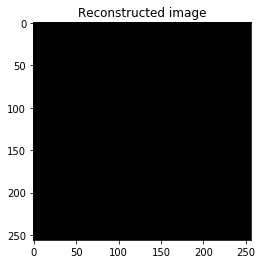

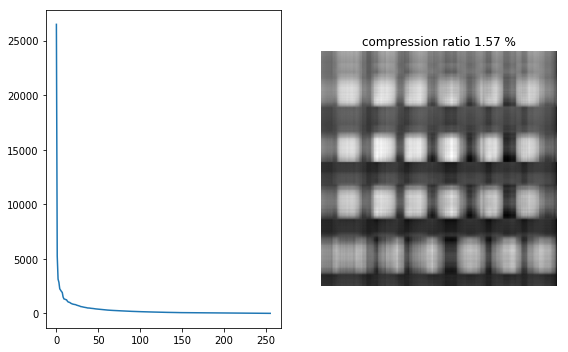

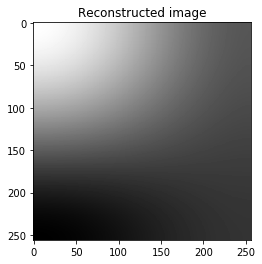

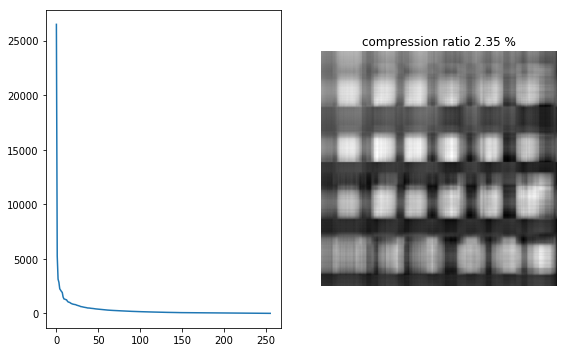

...

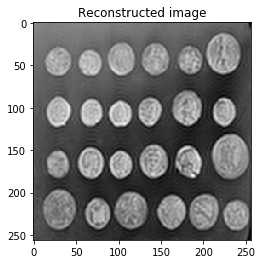

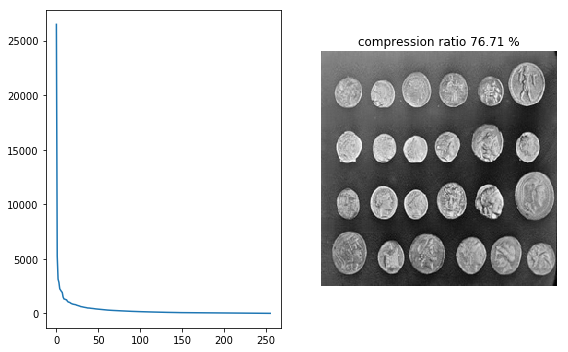

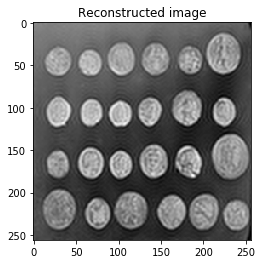

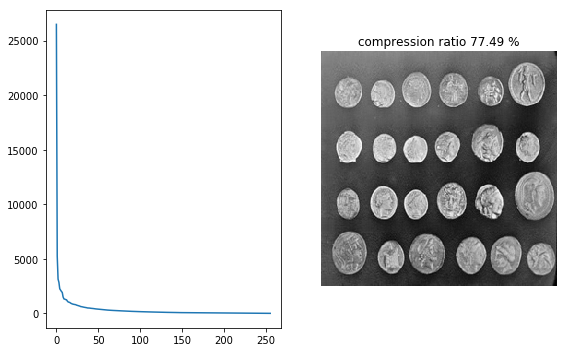

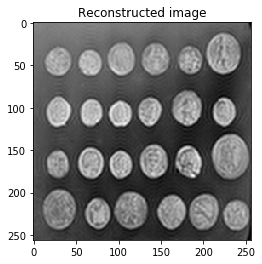

In [133]:
for i in range(1, 100):
    compress_svd_show_gray_images('coin', i)
    compress_dct_show_gray_images('coin', i)

http://www.ijcst.com/vol22/1/joko.pdf <br/>
    https://www.ijedr.org/papers/IJEDR1401120.pdf

http://m8sem.blogspot.com/2013/05/wavelets-image-compression.html

https://www.youtube.com/watch?v=jaXedw1Om1o

http://www.math.utah.edu/~gustafso/s2019/2270/projects-2016/kuhnConnor/kuhnConnor-svd-vs-dct-image-compression.pdf

http://www.ijoart.org/docs/Image-Compression-using-Singular-Value-Decomposition.pdf